In [ ]:
pip install pandas numpy scikit-learn transformers datasets evaluate plotly

## Importation des librairies

In [ ]:
import pandas as pd
import numpy as np
import sklearn
import plotly.express as px
import nltk
import spacy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize
import re
from gensim.test.utils import common_texts
from gensim.models import Word2Vec
import plotly.express as px
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
from wordcloud import WordCloud
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings('ignore')

## Chargement des données

In [ ]:
import plotly.io as pio
pio.renderers.default = "colab"

In [ ]:
from datasets import load_dataset

In [ ]:
## Data Collection: https://huggingface.co/datasets/financial_phrasebank

dataset = load_dataset('financial_phrasebank', 'sentences_allagree')

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['sentence', 'label'],
        num_rows: 2264
    })
})

In [ ]:
tmp_df = dataset['train'].to_pandas()

In [ ]:
tmp_df['label'].unique()

array([1, 2, 0])

In [ ]:
tmp_df.head()

,sentence,label
0,"According to Gran , the company has no plans t...",1
1,"For the last quarter of 2010 , Componenta 's n...",2
2,"In the third quarter of 2010 , net sales incre...",2
3,Operating profit rose to EUR 13.1 mn from EUR ...,2
4,"Operating profit totalled EUR 21.1 mn , up fro...",2


## Exploratory Data Analysis (EDA)

In [ ]:
import plotly.express as px
fig = px.pie(tmp_df, names
             = 'label', labels = 'label', title = 'Répartition des observations par classe')
fig

* Nous constatons que :
  - La majorité des observations du dataset appartiennent à la classe 1 avec un pourcentage de 61.4%.
  - 25 % des observations appartiennent à la classe 2.
  - La plus petite proportion correspond à la classe 0.

In [ ]:
tmp_df['length_text'] = tmp_df['sentence'].apply(lambda x: len(str(x)))

In [ ]:
tmp_df

,sentence,label,length_text
0,"According to Gran , the company has no plans t...",1,127
1,"For the last quarter of 2010 , Componenta 's n...",2,193
2,"In the third quarter of 2010 , net sales incre...",2,125
3,Operating profit rose to EUR 13.1 mn from EUR ...,2,122
4,"Operating profit totalled EUR 21.1 mn , up fro...",2,103
...,...,...,...
2259,Operating result for the 12-month period decre...,0,143
2260,HELSINKI Thomson Financial - Shares in Cargote...,0,248
2261,LONDON MarketWatch -- Share prices ended lower...,0,144
2262,Operating profit fell to EUR 35.4 mn from EUR ...,0,108


In [ ]:
fig = px.box(tmp_df, x = 'label', y = 'length_text')

fig.update_layout(
    title="Distribution des longueurs du texte par classe",
    xaxis_title="Classes",
    yaxis_title="Longueur du texte"
)

fig

* Nous constatons que la longueur du texte appartenant aux trois classes est **approximativement similaire**.
* Cette similitude de longueur de texte entre les trois classes simplifie l'analyse comparative en éliminant un biais potentiel lié à la longueur, facilitant ainsi une interprétation plus équitable des données

In [ ]:
tmp_df

,sentence,label,length_text
0,"According to Gran , the company has no plans t...",1,127
1,"For the last quarter of 2010 , Componenta 's n...",2,193
2,"In the third quarter of 2010 , net sales incre...",2,125
3,Operating profit rose to EUR 13.1 mn from EUR ...,2,122
4,"Operating profit totalled EUR 21.1 mn , up fro...",2,103
...,...,...,...
2259,Operating result for the 12-month period decre...,0,143
2260,HELSINKI Thomson Financial - Shares in Cargote...,0,248
2261,LONDON MarketWatch -- Share prices ended lower...,0,144
2262,Operating profit fell to EUR 35.4 mn from EUR ...,0,108


In [ ]:
fig = px.histogram(tmp_df, x='length_text', template='plotly_white', title='Nombre de phrases par longueur du texte')
fig.update_xaxes(categoryorder='total descending', title='Longueur du texte (Nombre de caractères)')
fig.update_yaxes(title='Nombre de phrases')
fig.show()


* On constate que les phrases ayant un nombre de caractères compris entre **50** et **129** sont **plus fréquentes** (plage prédominante).

* Cette observation mets en évidence une zone clé pour des investigations approfondies.

## Pre-processing & Text Cleaning

In [ ]:
def clean_text(x):
  x = x.lower()
  x = re.sub('[^a-zA-Z0-9.]', ' ', x)
  x = re.sub('( ){2,}',' ', x)
  return x

tmp_df['cleaned_text'] = tmp_df['sentence'].apply(clean_text)

In [ ]:
tmp_df.head()

,sentence,label,length_text,cleaned_text
0,"According to Gran , the company has no plans t...",1,127,according to gran the company has no plans to ...
1,"For the last quarter of 2010 , Componenta 's n...",2,193,for the last quarter of 2010 componenta s net ...
2,"In the third quarter of 2010 , net sales incre...",2,125,in the third quarter of 2010 net sales increas...
3,Operating profit rose to EUR 13.1 mn from EUR ...,2,122,operating profit rose to eur 13.1 mn from eur ...
4,"Operating profit totalled EUR 21.1 mn , up fro...",2,103,operating profit totalled eur 21.1 mn up from ...


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

text = tmp_df['cleaned_text']
model = CountVectorizer(ngram_range = (1, 1), stop_words='english')
matrix = model.fit_transform(text).toarray()
df_output = pd.DataFrame(data = matrix, columns = model.get_feature_names_out())
df_output.T.tail(5)

,0,1,2,3,4,5,6,7,8,9,...,2254,2255,2256,2257,2258,2259,2260,2261,2262,2263
zgody,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zinc,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zoltan,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zone,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zu,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### On souhaite analyser la fréquence des bigrammes dans les différentes phrases afin d'identifier les combinaisons de mots fréquemment utilisées.
 => Ces bigrammes correspondent donc aux expressions/termes les plus significatifs.

In [ ]:
def get_ngrams(text, ngram_from=2, ngram_to=2, n=None, max_features=20000):

    vec = CountVectorizer(ngram_range = (ngram_from, ngram_to),
                          max_features = max_features,
                          stop_words='english').fit(text)
    bag_of_words = vec.transform(text)
    sum_words = bag_of_words.sum(axis = 0)
    words_freq = [(word, sum_words[0, i]) for word, i in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)

    return words_freq[:n]

In [ ]:
bigrams = get_ngrams(tmp_df['cleaned_text'], ngram_from=2, ngram_to=2, n=150)
bigrams_df = pd.DataFrame(bigrams)
bigrams_df.columns=["Bigram", "Frequency"]
bigrams_df.head()

,Bigram,Frequency
0,eur mn,165
1,net sales,147
2,operating profit,145
3,mn eur,119
4,corresponding period,91


In [ ]:
fig = px.bar(bigrams_df, x='Bigram', y='Frequency')

fig.update_layout(
    title="Fréquence des Bigrammes",
    xaxis_title="Bigramme",
    yaxis_title="Fréquence"
)

fig.show()


* On constate que certaines combinaisons de mots se répètent assez fréquemment, ce qui nous permet d'identifier des expressions clés pour notre analyse.

# **Sentiment Analysis : Approche classique**

- Afin de réaliser notre analyse de sentiment, nous avons entrepris l'entraînement de modèles de classification en utilisant dans un premier temps les algorithmes suivants:  
  - **Logistic Regression**
  - **RandomForestClassifier**
  - **XGBoostingClassifier**
  - **SVM**

- Le prétraitement précédant cet entraînement est effectué en suivant les 5 approches suivantes :
  - **BOW**
  - **BOW + N_Grams**
  - **TF-IDF**
  - **TF-IDF + N_Grams**
  - **Word2Vec**

In [ ]:
# X, y servant au preprocessing et à l'entrainement des modèles
X = tmp_df['cleaned_text'].values
y = tmp_df['label'].values

In [ ]:
# Fonction de traitement approche Word2Vec
def document_vector(doc):
    word_vectors = [model.wv[word] for word in doc if word in model.wv]
    return np.mean(word_vectors, axis=0) if word_vectors else np.zeros(model.vector_size)

In [ ]:
vectorizer_BOW = CountVectorizer(max_features = 10000, min_df = 0.1, stop_words='english')
vectorizer_BOW_N_GRAMS = CountVectorizer(max_features = 10000, min_df = 0.05, stop_words='english', ngram_range=(1,3))
vectorizer_TF_IDF = TfidfVectorizer(max_features = 10000, stop_words='english')
vectorizer_TF_IDF_N_GRAMS = TfidfVectorizer(max_features = 10000, stop_words='english', ngram_range=(1,4))
# WORD2VEC
texts = [i.split() for i in tmp_df['cleaned_text']]
model = Word2Vec(sentences=texts, vector_size=300, window=10, min_count=2, workers=4)

In [ ]:
train_bow, test_bow, y_train, y_test = train_test_split(vectorizer_BOW.fit_transform(X), y, test_size = 0.2, random_state = 42 )
train_bow_n_grams , test_bow_n_grams , y_train, y_test = train_test_split(vectorizer_BOW_N_GRAMS.fit_transform(X), y, test_size = 0.2, random_state = 42 )
train_tf_idf , test_tf_idf , y_train, y_test = train_test_split(vectorizer_TF_IDF.fit_transform(X), y, test_size = 0.2, random_state = 42 )
train_tf_idf_n_grams , test_tf_idf_n_grams , y_train, y_test = train_test_split(vectorizer_TF_IDF_N_GRAMS.fit_transform(X), y, test_size = 0.2, random_state = 42 )
#Word2Vec
tmp_df['word2vec_avg'] = tmp_df['cleaned_text'].apply(lambda x: document_vector(x.split()))
X_train, X_test, y_train, y_test = train_test_split(tmp_df['word2vec_avg'].tolist(), tmp_df['label'], test_size=0.2, random_state=42)
train_w2v = np.vstack(X_train)
test_w2v = np.vstack(X_test)

### 1. **Entraînement des modèles ML choisis**:

In [ ]:
# Modèles de classification
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'SVM': SVC(kernel='rbf')
}

# Entraînement et évaluation des modèles
for model_name, model in models.items():
    print('========================='+model_name+'=============================')
    # Entraînement sur Bag-of-Words
    model.fit(train_bow, y_train)
    predictions = model.predict(test_bow)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (Bag-of-Words) - Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, predictions))

    # Entraînement sur Bag-of-Words_N_Grams
    model.fit(train_bow_n_grams, y_train)
    predictions = model.predict(test_bow_n_grams)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (Bag-of-Words-N-Grams) - Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, predictions))

    # Entraînement sur TF-IDF
    model.fit(train_tf_idf, y_train)
    predictions = model.predict(test_tf_idf)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (TF-IDF) - Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, predictions))

    # Entraînement sur TF-IDF_N_Grams
    model.fit(train_tf_idf_n_grams, y_train)
    predictions = model.predict(test_tf_idf_n_grams)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (TF-IDF N-Grams) - Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, predictions))

    # Entraînement sur Word2Vec
    model.fit(train_w2v, y_train)
    predictions = model.predict(test_w2v)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (Word2Vec) - Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, predictions))



=========================Logistic Regression=============================

Logistic Regression (Bag-of-Words) - Accuracy: 0.7108
              precision    recall  f1-score   support

           0       0.38      0.18      0.24        56
           1       0.78      0.95      0.86       276
           2       0.54      0.40      0.46       121

    accuracy                           0.71       453
   macro avg       0.57      0.51      0.52       453
weighted avg       0.67      0.71      0.68       453


Logistic Regression (Bag-of-Words-N-Grams) - Accuracy: 0.7704
              precision    recall  f1-score   support

           0       0.63      0.34      0.44        56
           1       0.81      0.96      0.88       276
           2       0.69      0.53      0.60       121

    accuracy                           0.77       453
   macro avg       0.71      0.61      0.64       453
weighted avg       0.75      0.77      0.75       453


Logistic Regression (TF-IDF) - Accuracy: 0.82

=========================Logistic Regression=============================

Logistic Regression (Bag-of-Words) - Accuracy: 0.7108

Logistic Regression (Bag-of-Words-N-Grams) - Accuracy: 0.7704

Logistic Regression (TF-IDF) - Accuracy: 0.8212

Logistic Regression (TF-IDF N-Grams) - Accuracy: 0.8146

Logistic Regression (Word2Vec) - Accuracy: 0.7263


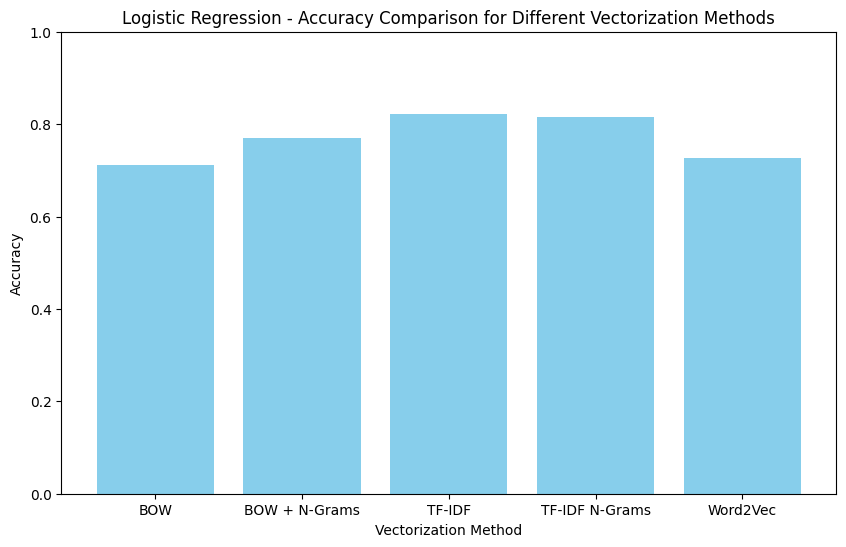

=========================Random Forest=============================

Random Forest (Bag-of-Words) - Accuracy: 0.7064

Random Forest (Bag-of-Words-N-Grams) - Accuracy: 0.7285

Random Forest (TF-IDF) - Accuracy: 0.8411

Random Forest (TF-IDF N-Grams) - Accuracy: 0.8234

Random Forest (Word2Vec) - Accuracy: 0.6998


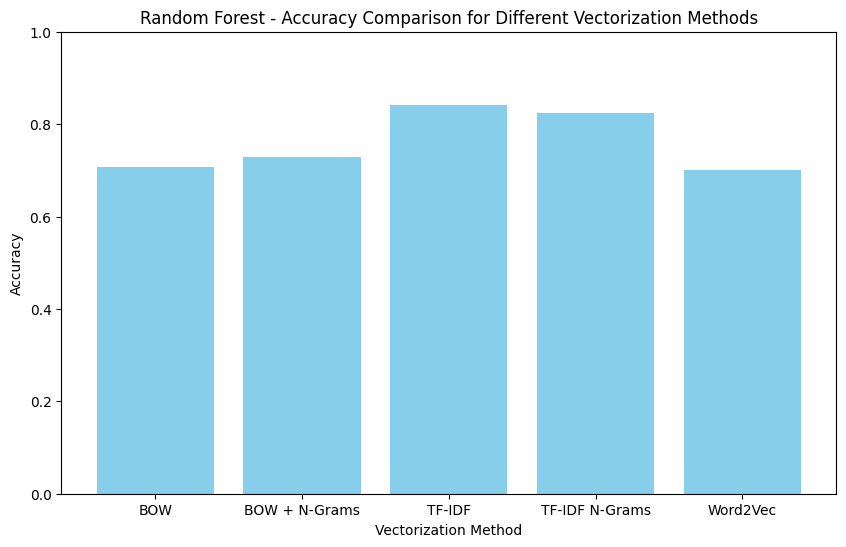

=========================XGBoost=============================

XGBoost (Bag-of-Words) - Accuracy: 0.7152

XGBoost (Bag-of-Words-N-Grams) - Accuracy: 0.7550

XGBoost (TF-IDF) - Accuracy: 0.8675

XGBoost (TF-IDF N-Grams) - Accuracy: 0.8830

XGBoost (Word2Vec) - Accuracy: 0.7219


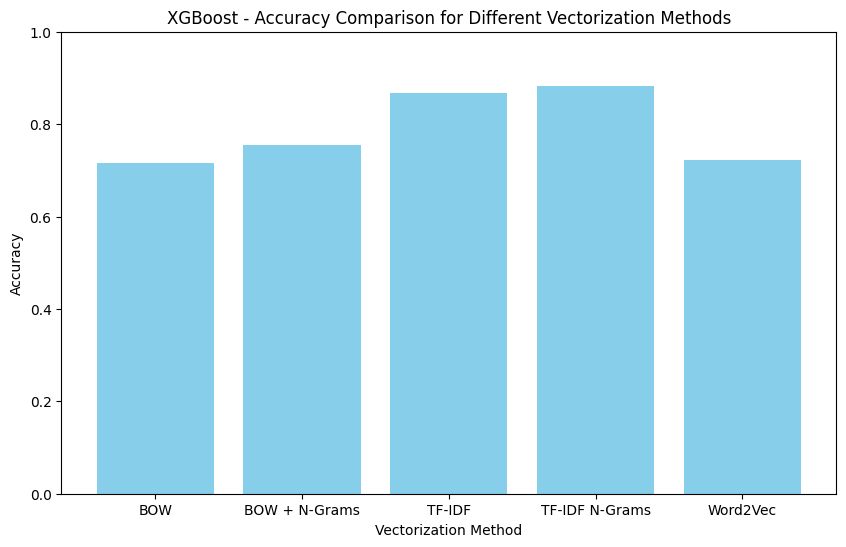

=========================SVM=============================

SVM (Bag-of-Words) - Accuracy: 0.7108

SVM (Bag-of-Words-N-Grams) - Accuracy: 0.7506

SVM (TF-IDF) - Accuracy: 0.8013

SVM (TF-IDF N-Grams) - Accuracy: 0.8057

SVM (Word2Vec) - Accuracy: 0.6777


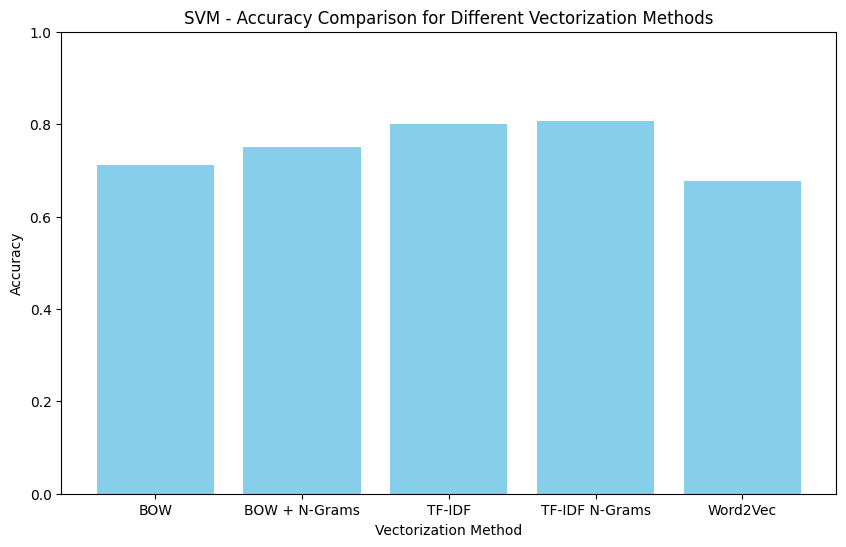

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Modèles de classification
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(),
    'SVM': SVC(kernel='rbf')
}

# Entraînement et évaluation des modèles
for model_name, model in models.items():
    print('========================='+model_name+'=============================')

    # Lists to store accuracy values for different vectorization methods
    accuracy_values = []

    # Entraînement sur Bag-of-Words
    model.fit(train_bow, y_train)
    predictions = model.predict(test_bow)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (Bag-of-Words) - Accuracy: {accuracy:.4f}")
    accuracy_values.append(accuracy)

    # Entraînement sur Bag-of-Words_N_Grams
    model.fit(train_bow_n_grams, y_train)
    predictions = model.predict(test_bow_n_grams)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (Bag-of-Words-N-Grams) - Accuracy: {accuracy:.4f}")
    accuracy_values.append(accuracy)

    # Entraînement sur TF-IDF
    model.fit(train_tf_idf, y_train)
    predictions = model.predict(test_tf_idf)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (TF-IDF) - Accuracy: {accuracy:.4f}")
    accuracy_values.append(accuracy)

    # Entraînement sur TF-IDF_N_Grams
    model.fit(train_tf_idf_n_grams, y_train)
    predictions = model.predict(test_tf_idf_n_grams)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (TF-IDF N-Grams) - Accuracy: {accuracy:.4f}")
    accuracy_values.append(accuracy)

    # Entraînement sur Word2Vec
    model.fit(train_w2v, y_train)
    predictions = model.predict(test_w2v)
    accuracy = accuracy_score(y_test, predictions)
    print(f"\n{model_name} (Word2Vec) - Accuracy: {accuracy:.4f}")
    accuracy_values.append(accuracy)

    # Plotting the accuracy values for different vectorization methods
    vectorization_methods = ['BOW', 'BOW + N-Grams', 'TF-IDF', 'TF-IDF N-Grams', 'Word2Vec']
    plt.figure(figsize=(10, 6))
    plt.bar(vectorization_methods, accuracy_values, color='skyblue')
    plt.title(f'{model_name} - Accuracy Comparison for Different Vectorization Methods')
    plt.xlabel('Vectorization Method')
    plt.ylabel('Accuracy')
    plt.ylim([0, 1])
    plt.show()


### 2. **Analyse des résultats obtenus**:

* Les modèles basés sur les méthodes de préprocessing TF-IDF semblent mieux performants:
  * **Logistic Regression**: la meilleure performance est obtenue avec TF-IDF (Accuracy: 82.12%).
  * Les modèles **Random Forest** avec TF-IDF et TF-IDF N-Grams présentent les meilleures performances (Accuracy: 83.44% et 84.33%, respectivement).
  * **XGBoost** avec TF-IDF et TF-IDF N-Grams donnent également de bons résultats (Accuracy: 86.75% et 85.87%, respectivement).
  * **SVM** avec TF-IDF obtient une précision décente (Accuracy: 80.13%).
*Word2Vec semble moins adapté à notre analyse par rapport aux approches basées sur BOW ou TF-IDF.

### 3. **Conclusions**:

* XGBoost, Random Forest et SVM montrent des performances comparables, avec XGBoost légèrement en tête.

* Le choix de la méthode de prétraitement des données joue un rôle déterminant dans les performances des modèles de sentiment analysis.

* L'approche TF-IDF, notamment lorsqu'elle est combinée avec l'utilisation d'N-Grams, se distingue en présentant des résultats prometteurs.

# **Topic Modelling & Visualization**

Nous allons réaliser une analyse de modélisation de sujets en utilisant deux méthodes distinctes, dans le but de comparer leurs performances respectives et de sélectionner la plus efficace:

### 1.**Approche LDA (Latent Dirichlet Allocation)**

In [ ]:
import os
import pandas as pd
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
tfidf = TfidfVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1), min_df = 0.1,
                        tokenizer = tokenizer.tokenize)

# Fit and Transform the documents
train_data = tfidf.fit_transform(tmp_df['cleaned_text'].tolist())

# Define the number of topics or components
num_components=5
# Create LDA object
model=LatentDirichletAllocation(n_components=num_components)
# Fit and Transform SVD model on data
lda_matrix = model.fit_transform(train_data)
# Get Components
lda_components=model.components_

In [ ]:
# Print the topics with their terms
terms = tfidf.get_feature_names_out()
for index, component in enumerate(lda_components):
    zipped = zip(terms, component)
    top_terms_key=sorted(zipped, key = lambda t: t[1], reverse=True)[:7]
    top_terms_list=list(dict(top_terms_key).keys())
    print("Topic "+str(index)+": ",top_terms_list)

Topic 0:  ['net', 'profit', 'sales', 'company', 's', '1', 'eur']
Topic 1:  ['eur', 'profit', '1', 's', 'net', 'company', 'sales']
Topic 2:  ['s', 'company', 'profit', 'sales', '1', 'net', 'eur']
Topic 3:  ['1', 'sales', 's', 'profit', 'eur', 'net', 'company']
Topic 4:  ['mn', 'eur', 'profit', '1', 'net', 'sales', 's']


#### Analyse des résulats:

* On remarque que les termes associés à chaque topic semblent assez similaires d'un topic à l'autre. Par exemple, les termes "profit", "net", "eur" et "sales" apparaissent fréquemment dans tous les topics.

* Cela indique une difficulté pour le modèle à distinguer de manière précise et efficace les différents sujets (thèmes).

### 2. **Approche NMF (Non Negative Matrix Factorization)**

In [ ]:
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import RegexpTokenizer

num_topics = 15
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
tfidf = TfidfVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1), min_df = 0.1,
                        tokenizer = tokenizer.tokenize)

# Fit and Transform the documents
train_data = tfidf.fit_transform(tmp_df['cleaned_text'].tolist())


nmf_model = NMF(n_components=num_topics, random_state=42)
nmf_model.fit(train_data)

# Afficher les mots clés pour chaque sujet
feature_names = tfidf.get_feature_names_out()
for topic_idx, topic in enumerate(nmf_model.components_):
    top_words_idx = topic.argsort()[:-10-1:-1]  # Les 10 mots les mieux classés
    top_words = [feature_names[i] for i in top_words_idx]
    print(f"Sujet {topic_idx + 1}: {', '.join(top_words)}")


Sujet 1: s, mn, net, sales, profit, eur, company, 1
Sujet 2: profit, net, 1, s, company, sales, eur, mn
Sujet 3: mn, eur, sales, s, net, profit, company, 1
Sujet 4: sales, net, company, s, profit, mn, eur, 1
Sujet 5: mn, s, profit, company, net, sales, eur, 1
Sujet 6: net, s, profit, sales, mn, eur, company, 1
Sujet 7: company, 1, sales, s, net, profit, eur, mn
Sujet 8: 1, s, profit, sales, net, mn, eur, company
Sujet 9: 1, sales, profit, s, net, mn, eur, company
Sujet 10: eur, sales, profit, s, net, mn, company, 1
Sujet 11: eur, profit, s, sales, net, mn, company, 1
Sujet 12: sales, s, profit, net, mn, eur, company, 1
Sujet 13: net, sales, eur, s, profit, mn, company, 1
Sujet 14: s, sales, profit, net, mn, eur, company, 1
Sujet 15: company, s, profit, sales, net, mn, eur, 1


#### Analyse des résulats:
- On constate que les topics détectés sont presque identiques à ceux détectés avec le modèle Latent Dirichlet Allocation.
- Le modèle identifie le même topic qui se répète à chaque nouvelle détection.
- Ce modèle n'est clairement pas adapté à nos documents, et sa performance est nettement médiocre par rapport au modèle LDA.

### 3. **Amélioration du modèle LDA**:  

On cherche à améliorer la qualité de notre modèle LDA afin d'obtenir des sujets encore plus distincts et informatifs:

### > **LDA en variant le nombre de topics générés, ainsi qu'en utilisant la librairie gensim:**

Number of unique tokens: 551
Number of documents: 2264
[[(0, 1), (1, 1), (2, 2), (3, 1), (4, 2), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)]]

Coherence Score:  [0.40215585761884604, 0.5996311537176544, 0.5507230946058674, 0.2280677537588583, 0.23288499571053123]

Number of Topics: 5
(0, '0.053*"share" + 0.045*"per" + 0.041*"at" + 0.030*"on" + 0.024*"board" + 0.021*"earnings" + 0.020*"eps" + 0.019*"includes" + 0.017*"deal" + 0.016*"two"')
(1, '0.134*"mn" + 0.063*"profit" + 0.051*"operating" + 0.043*"quarter" + 0.037*"sales" + 0.036*"period" + 0.033*"down" + 0.028*"decreased" + 0.026*"net" + 0.022*"was"')
(2, '0.048*"million" + 0.042*"finnish" + 0.040*"mln" + 0.034*"net" + 0.031*"its" + 0.028*"year" + 0.025*"euro" + 0.025*"said" + 0.024*"sales" + 0.022*"company"')
(3, '0.059*"will" + 0.045*"is" + 0.041*"be" + 0.031*"company" + 0.027*"by" + 0.025*"has" + 0.023*"at" + 0.019*"business" + 0.017*"that" + 0.016*"its"')
(4, '0.072*"as" + 0.037*"is" + 0.033*"finland" + 0.032*"with" + 0.032*"shares"

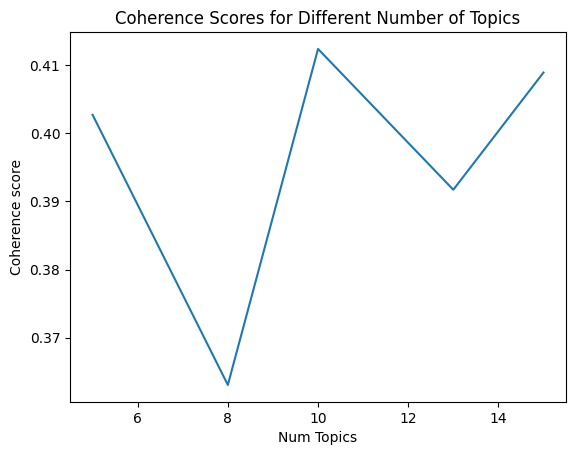

In [ ]:
import gensim
from gensim.corpora.dictionary import Dictionary
from gensim.models import Phrases
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess
import matplotlib.pyplot as plt
import numpy as np

# Prétraitement: Remove rare & common tokens & Create a dictionary representation of the documents.

def sent_to_words(sentences):
    for sentence in sentences:
        # 'deacc=True' removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

docs = list(sent_to_words(tmp_df['cleaned_text'].tolist()))

bigram = Phrases(docs, min_count=10)
trigram = Phrases(bigram[docs])

dictionary = Dictionary(docs)
dictionary.filter_extremes(no_below=10, no_above=0.2)

# Create dictionary and corpus required for Topic Modeling
corpus = [dictionary.doc2bow(doc) for doc in docs]
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))
print(corpus[:1])

# Set parameters.
chunksize = 500
passes = 20
iterations = 400
eval_every = 1

# List to store coherence scores
coherence_scores = []

# Iterate over different values of num_topics
for num_topics in [5,8,10,13,15]:
    # Entrainement du modèle
    lda_model = LdaModel(corpus=corpus, id2word=dictionary, chunksize=chunksize, \
                           alpha='auto', eta='auto', \
                           iterations=iterations, num_topics=num_topics, \
                           passes=passes, eval_every=eval_every)

    # Compute Coherence Score using c_v
    coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
    print('\nCoherence Score: ', coherence_model_lda.get_coherence_per_topic())
    coherence_score = coherence_model_lda.get_coherence()
    coherence_scores.append(coherence_score)

    # Print the Keyword in the topics
    topics = lda_model.print_topics()
    print(f"\nNumber of Topics: {num_topics}")
    for topic in topics:
        print(topic)

# Plot the coherence scores
plt.plot([5,8,10,13,15], coherence_scores)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.title("Coherence Scores for Different Number of Topics")
plt.show()


#### Analyse des résultats:

* On constate que le score de cohérence, qui mesure la qualité de la détection et de la répartition des mots dans les topics, varie en fonction de leur nombre.
  * La cohérence de chaque topic, ainsi que les probabilités d'appartenance associées aux mots, varient à chaque exécution.
* Un point important est que le modèle LDA de gensim est meilleur que celui utilisé précédemment (Latent Dirichlet Allocation).
  * Le LDA de gensim répartit de manière pertinente et logique des probabilités à des mots significatifs, les classant dans des topics tout en veillant à leurs similitudes.

### > **Vérification et validation des hyper-parmètres du modèle LDA en utilisant de l'aléatoire**

* Afin de vérifier et valider un modèle LDA ainsi que ses hyperparamètres, on peut appliquer la méthode de comparaison avec un modèle LDA aléatoire.
*  On fait varier le nombre de topics en comparant le score de cohérence générale (de tous les topics) entre le LDA construit et l'aléatoire.
* Cela nous permet de fixer le paramètre 'num_topics'. Le 'num_topics' est ajusté à la valeur pour laquelle la cohérence du LDA construit est presque identique à celle du modèle aléatoire.

In [ ]:
import gensim
from gensim.corpora.dictionary import Dictionary
from gensim.models import Phrases
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess
import matplotlib.pyplot as plt
import numpy as np

# Prétraitement: Remove rare & common tokens & Create a dictionary representation of the documents.

def sent_to_words(sentences):
    for sentence in sentences:
        # 'deacc=True' removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

docs = list(sent_to_words(tmp_df['cleaned_text'].tolist()))

bigram = Phrases(docs, min_count=10)
trigram = Phrases(bigram[docs])

dictionary = Dictionary(docs)
dictionary.filter_extremes(no_below=10, no_above=0.2)

# Create dictionary and corpus required for Topic Modeling
corpus = [dictionary.doc2bow(doc) for doc in docs]

print(corpus[:1])

# Set parameters.
chunksize = 500
passes = 20
iterations = 400
eval_every = 1
nums_topics = [5,8,10,13,15]


for num_topics in nums_topics :
  # Entrainement du modèle
  lda_model_real  = LdaModel(corpus=corpus, id2word=dictionary, chunksize=chunksize, \
                        alpha='auto', eta='auto', \
                        iterations=iterations, num_topics=num_topics, \
                        passes=passes, eval_every=eval_every)

  # Génération d'un modèle aléatoire
  lda_model_random = LdaModel(corpus=corpus, id2word=dictionary, chunksize=chunksize, \
                        alpha='auto', eta='auto', \
                        iterations=iterations, num_topics=num_topics, \
                        passes=passes, eval_every=eval_every)

  for topic_id in range(num_topics):
      # Attribution aléatoire de poids aux mots dans chaque sujet
      topic = np.random.rand(len(dictionary))
      topic /= topic.sum()  # Normalisation des poids
      lda_model_random.state.get_lambda()[topic_id] = topic

  # Calcul des scores de cohérence
  coherence_model_real = CoherenceModel(model=lda_model_real, texts=docs,dictionary=dictionary, coherence='c_v')
  coherence_model_random = CoherenceModel(model=lda_model_random, texts=docs,dictionary=dictionary, coherence='c_v')


  # Obtention des scores de cohérence
  coherence_real = coherence_model_real.get_coherence()
  coherence_random = coherence_model_random.get_coherence()

  # Comparaison des scores
  print('\n================================ nombre de topics = ', num_topics, '===================================')
  print("Score de cohérence pour le modèle réel :", coherence_real)
  print("Score de cohérence pour le modèle aléatoire :", coherence_random)


[[(0, 1), (1, 1), (2, 2), (3, 1), (4, 2), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)]]

================================ nombre de topics =  5 ===================================
Score de cohérence pour le modèle réel : 0.38351966158824996
Score de cohérence pour le modèle aléatoire : 0.35283662533408044

================================ nombre de topics =  8 ===================================
Score de cohérence pour le modèle réel : 0.3923295479017386
Score de cohérence pour le modèle aléatoire : 0.4222131548953073

================================ nombre de topics =  10 ===================================
Score de cohérence pour le modèle réel : 0.44093220205681316
Score de cohérence pour le modèle aléatoire : 0.3862464451193114

================================ nombre de topics =  13 ===================================
Score de cohérence pour le modèle réel : 0.419003658618629
Score de cohérence pour le modèle aléatoire : 0.414173332141302

================================ nombre de to

### 4. **Visualisation des topics du modèle LDA**:  

Number of unique tokens: 551
Number of documents: 2264
[[(0, 1), (1, 1), (2, 2), (3, 1), (4, 2), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)]]


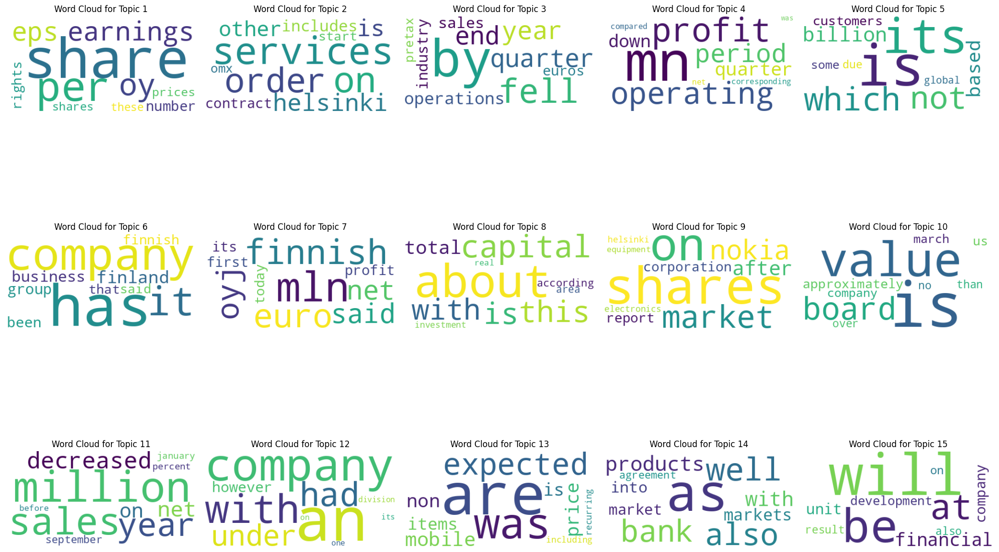

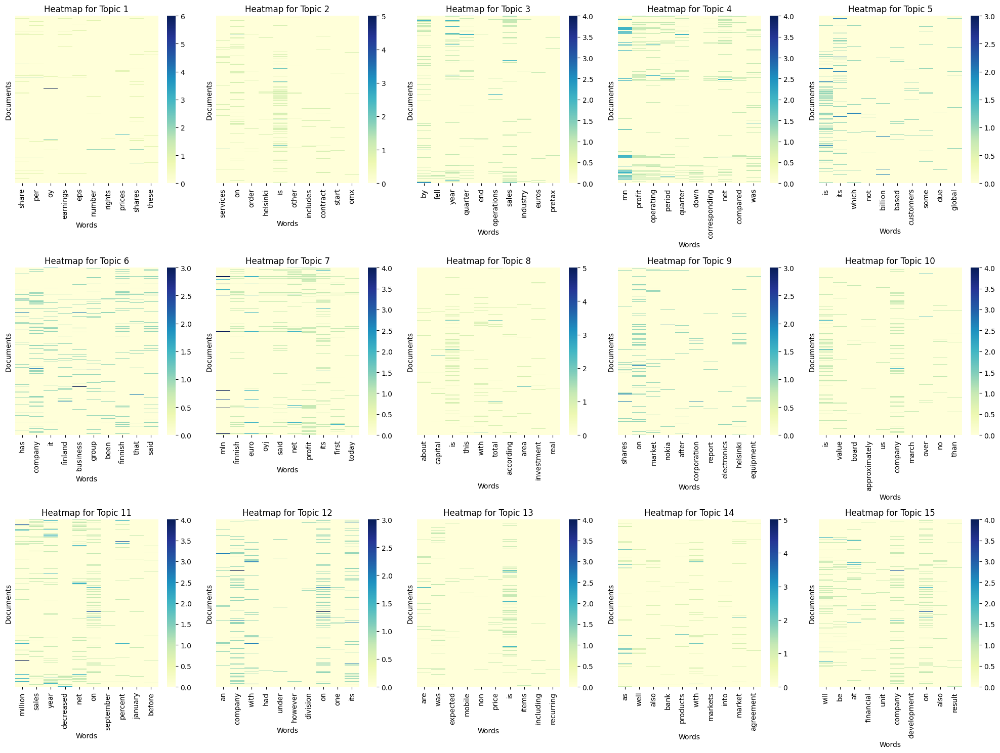


Coherence Score:  [0.5278229922399718, 0.33590679627372844, 0.35355404801886214, 0.6719648390758122, 0.3347810467905635, 0.3405175277460115, 0.7556148343085044, 0.42115531095979863, 0.2949750249531062, 0.49950165312946987, 0.32915212059900734, 0.34962196937940904, 0.40285876638904244, 0.33510423160530395, 0.3647566916295979]


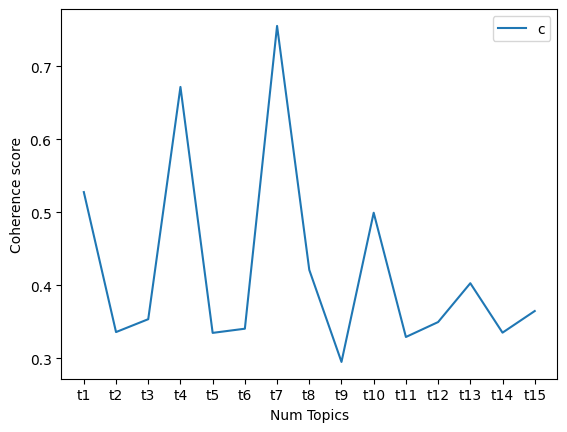

In [ ]:
# Imporatation des bibliothèques

import gensim
from gensim.corpora.dictionary import Dictionary
from gensim.models import Phrases
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess

# Prétraitement:  Remove rare & common tokens & Create a dictionary representation of the documents.

def sent_to_words(sentences):
    for sentence in sentences:
        # 'deacc=True' removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

docs = list(sent_to_words(tmp_df['cleaned_text'].tolist()))

bigram = Phrases(docs, min_count=10)
trigram = Phrases(bigram[docs])

dictionary = Dictionary(docs)
dictionary.filter_extremes(no_below=10, no_above=0.2)

# Create dictionary and corpus required for Topic Modeling
corpus = [dictionary.doc2bow(doc) for doc in docs]
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))
print(corpus[:1])

# Set parameters.
num_topics = 15
chunksize = 500
passes = 20
iterations = 400
eval_every = 1

# Make a index to word dictionary.
temp = dictionary[0]  # only to "load" the dictionary.
id2word = dictionary.id2token

# Entrainement du modèle
lda_model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)

# Affichage des nuages de mots pour chaque sujet
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 15))

for topic_id in range(num_topics):
    # Nuage de mots
    row, col = divmod(topic_id, 5)
    wordcloud = WordCloud(contour_width=3, background_color='white').generate_from_frequencies(dict(lda_model.show_topic(topic_id, topn=10)))
    axes[row, col].imshow(wordcloud, interpolation='bilinear')
    axes[row, col].set_title(f"Word Cloud for Topic {topic_id + 1}")
    axes[row, col].axis('off')


plt.tight_layout()
plt.show()

# Affichage des cartes de chaleur pour chaque sujet dans une seule figure sur 3 lignes et 5 colonnes
fig_heatmap, axes_heatmap = plt.subplots(nrows=3, ncols=5, figsize=(20, 15))

for topic_id in range(num_topics):
    # Carte de chaleur
    row, col = divmod(topic_id, 5)
    topic_words = [word for word, _ in lda_model.show_topic(topic_id, topn=10)]
    topic_matrix = np.zeros((len(docs), len(topic_words)))

    for i, doc in enumerate(docs):
        for j, word in enumerate(topic_words):
            topic_matrix[i, j] = sum([1 for w in doc if w == word])

    sns.heatmap(topic_matrix, cmap='YlGnBu', xticklabels=topic_words, yticklabels=False, ax=axes_heatmap[row, col])
    axes_heatmap[row, col].set_title(f"Heatmap for Topic {topic_id + 1}")
    axes_heatmap[row, col].set_xlabel("Words")
    axes_heatmap[row, col].set_ylabel("Documents")

plt.tight_layout()
plt.show()

# Compute Coherence Score using c_v
coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
coherence_ldas = coherence_model_lda.get_coherence_per_topic()
print('\nCoherence Score: ', coherence_ldas)

import matplotlib.pyplot as plt
import numpy as np
topicsname=[]
for i in range(1,num_topics+1):
    topicsname.append("t{0}".format(i))
topicsname

plt.plot(topicsname,coherence_ldas)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()


### Analyse et conclusion:

* On a finalement un modèle assez cohérent avec 'num_topics' égal à 15.
* Sachant que l'augmentation du nombre de topics est proportionnelle à la cohérence, on pourrait décider de fixer ce paramètre à une valeur importante, mais cela ne refléterait pas la véracité de l'étude ainsi que ses besoins d'utilisation.

# **Sentiment Analysis : Part 2 (Fine-tune LMs)**


Pour la deuxième partie de notre Sentiment Analysis, nous nous pencherons sur l'utilisation de transformers de pointe tels que BERT, RoBERTa et AlBERT:

In [ ]:
!pip install pyldavis

In [ ]:
!pip install accelerate

 * Reinitialiser le kernel aprés cette installation :

In [ ]:
# Check: https://www.kaggle.com/code/trnduythanhkhttt/lda-and-topic-coherence-score

In [ ]:
import torch
print(torch.cuda.is_available())

True


## Chargement des données

In [ ]:
from datasets import load_dataset

dataset = load_dataset("financial_phrasebank", "sentences_allagree")
print(dataset["train"][10])

{'sentence': 'Its board of directors will propose a dividend of EUR0 .12 per share for 2010 , up from the EUR0 .08 per share paid in 2009 .', 'label': 2}


In [ ]:
from transformers import AutoTokenizer
import numpy as np
import evaluate
from transformers import TrainingArguments, Trainer
from transformers import AutoModelForSequenceClassification

def tokenize_function(examples):
    return tokenizer(examples["sentence"], padding="max_length", truncation=True)

transformer_models = ['bert-base-cased','albert-base-v2','roberta-base']
for transformer_model in transformer_models :

  print('================================= ',transformer_model, ' ====================================')
  tokenizer = AutoTokenizer.from_pretrained(transformer_model)

  tokenized_datasets = dataset.map(tokenize_function, batched=True)

  small_train_dataset = tokenized_datasets["train"].select(range(1812))
  small_eval_dataset = tokenized_datasets["train"].select(range(1812,2264))

  model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=3)
  metric = evaluate.load("accuracy")

  def compute_metrics(eval_pred):
      logits, labels = eval_pred
      predictions = np.argmax(logits, axis=-1)
      return metric.compute(predictions=predictions, references=labels)


  training_args = TrainingArguments(output_dir="drive/MyDrive/Colab Notebooks/"+transformer_model+"/test_trainer", evaluation_strategy="steps")

  trainer = Trainer(
      model=model,
      args=training_args,
      train_dataset=small_train_dataset,
      eval_dataset=small_eval_dataset,
      compute_metrics=compute_metrics,
  )

  trainer.train()
  print(trainer.evaluate())
  trainer.save_model("drive/MyDrive/Colab Notebooks/"+transformer_model+"/test_trainer")

=================================  bert-base-cased  ====================================


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
500,0.192400,1.083647,0.809735


{'eval_loss': 1.3696577548980713, 'eval_accuracy': 0.7566371681415929, 'eval_runtime': 15.7543, 'eval_samples_per_second': 28.691, 'eval_steps_per_second': 3.618, 'epoch': 3.0}
=================================  albert-base-v2  ====================================


Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
500,0.376000,2.720675,0.382743


{'eval_loss': 2.894225835800171, 'eval_accuracy': 0.3805309734513274, 'eval_runtime': 17.1895, 'eval_samples_per_second': 26.295, 'eval_steps_per_second': 3.316, 'epoch': 3.0}
=================================  roberta-base  ====================================


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.out_proj.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
500,0.228800,0.463392,0.926991


{'eval_loss': 0.7897834181785583, 'eval_accuracy': 0.8672566371681416, 'eval_runtime': 14.0904, 'eval_samples_per_second': 32.079, 'eval_steps_per_second': 4.045, 'epoch': 3.0}


#### Analyse des résultats:

* Après avoir analysé la signification des trois labels (0 => négatif, 1 => neutre, 2 => positif), on constate que le modèle BERT est performant. Il parvient à détecter et prédire correctement les sentiments des expressions en entrée, avec un score très élevé.

* On observe une différence au niveau de la quantité de données d'entraînement entre les modèles classiques et les modèles pré-entraînés:

  - Une faible nécessité de quantité de données d'apprentissage dans le cas du modèle pré-entraîné (BERT), car ce dernier a déjà été entraîné sur un grand nombre de données couvrant divers domaines. Néanmoins, des données spécifiques au domaine d'analyse des sentiments (données financières) seraient nécessaires.
  - La quantité de données d'apprentissage reste un paramètre crucial dans le cas des modèles classiques.


# **Pipline**

In [ ]:
from transformers import pipeline
from transformers import AutoTokenizer, AutoModelForSequenceClassification
# Exemple d'une nouvelle phrase à prédire
phrases = [
    "The company recorded significant growth in the last quarter.",
    "The stock market experienced high volatility this week due to trade tensions.",
    "Technological innovation is a key driver of business competitiveness.",
    "The central bank's monetary policy directly impacts inflation and exchange rates.",
    "Globalization has transformed traditional economic models and opened new business opportunities."
]


for transformer_model in transformer_models :
  # Charger le modèle entraîné
  # Assurez-vous de spécifier le bon chemin
  model_trained = AutoModelForSequenceClassification.from_pretrained("drive/MyDrive/Colab Notebooks/"+transformer_model+"/test_trainer")

  # Charger le tokenizer
  tokenizer = AutoTokenizer.from_pretrained(transformer_model)

  # Créer un pipeline pour la classification de séquences
  classifier = pipeline("sentiment-analysis", model=model_trained, tokenizer=tokenizer)
  # Faire la prédiction
  prediction = classifier(phrases)

  # Afficher la prédiction
  print('\n================================= Predictions réalisées avec le modèle = ', transformer_model)
  for i in range(len(phrases)) :
    print(i,' : ', phrases[i],' => ',prediction[i]['label'],' avec un score = ',prediction[i]['score'])



================================= Predictions réalisées avec le modèle =  bert-base-cased
0  :  The company recorded significant growth in the last quarter.  =>  LABEL_2  avec un score =  0.9991388320922852
1  :  The stock market experienced high volatility this week due to trade tensions.  =>  LABEL_2  avec un score =  0.9985359907150269
2  :  Technological innovation is a key driver of business competitiveness.  =>  LABEL_1  avec un score =  0.9920382499694824
3  :  The central bank's monetary policy directly impacts inflation and exchange rates.  =>  LABEL_1  avec un score =  0.999840259552002
4  :  Globalization has transformed traditional economic models and opened new business opportunities.  =>  LABEL_2  avec un score =  0.995186984539032

================================= Predictions réalisées avec le modèle =  albert-base-v2
0  :  The company recorded significant growth in the last quarter.  =>  LABEL_2  avec un score =  0.9842013716697693
1  :  The stock market experienced h

### Analyses et conclusion:

- La pipeline avec BERT est la plus fiable des trois, car les deux autres modèles sont des versions allégées de celui-ci.

- Nous avons testé les modèles Bart (Meta) et GPT-2, mais leurs exécutions nécessitaient une mémoire et une quantité de temps importantes.

Revenons aux détails de nos prédictions :

  - Nous avons pris soin de considérer comme tests cinq phrases ayant la même langue et le même contexte que les données d'entraînement.
  - Le modèle RoBERTa est meilleur par rapport à ALBERT, et les deux sont moins performants et efficaces par rapport à leur source, BERT.
  - Un point critique est que l'accuracy lors de l'entraînement d'ALBERT avoisine les 39 %, tandis que RoBERTa et BERT sont respectivement à 90 % et 98 %. Cependant, lors de la prédiction, les scores sont plutôt importants pour tous les trois modèles, même si les labels prédits sont parfois faux lorsque c'est ALBERT qui est en jeu.
  
Le meilleur compromis est de choisir le modèle RoBERTa, car son temps d'entraînement est rapide par rapport à BERT, et il atteindra presque les mêmes niveaux de performance en effectuant le bon prétraitement des données.

# **Explanabilité**

In [ ]:
!pip install shap

In [ ]:
import shap
import torch
import scipy as sp

In [ ]:
for transformer_model in transformer_models :
  # Charger le modèle entraîné
  # Assurez-vous de spécifier le bon chemin
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  model = AutoModelForSequenceClassification.from_pretrained("drive/MyDrive/Colab Notebooks/"+transformer_model+"/test_trainer")
  model.to(device)

  # Charger le tokenizer
  tokenizer = AutoTokenizer.from_pretrained(transformer_model)

  def f(x):
    tv = torch.tensor(
        [
            tokenizer.encode(v, padding="max_length", max_length=128, truncation=True)
            for v in x
        ]
    ).cuda()
    attention_mask = (tv != 0).type(torch.int64).cuda()
    outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores)
    return val

  labels = sorted(model.config.label2id, key=model.config.label2id.get)
  explainer = shap.Explainer(f, tokenizer, output_names=labels)

  print('\n\n\t\t\t\t=====================================',transformer_model,'===============================================')

  shap_values = explainer(dataset['train']['sentence'][:3])
  shap.plots.text(shap_values)




				===================================== bert-base-cased ===============================================


PartitionExplainer explainer: 4it [00:19,  6.64s/it]




				===================================== albert-base-v2 ===============================================


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 2/3 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 4it [00:16,  8.41s/it]




				===================================== roberta-base ===============================================


PartitionExplainer explainer: 4it [00:13, 13.45s/it]               




* Nous disposons des poids attribués par les modèles à chaque mot pour les trois premières phrases . Ces poids ont permis de prédire correctement ou pas les étiquettes cibles.
  * En analysant les poids attribués à chaque mot de chaque phrase, nous pouvons facilement interpréter et comprendre la décision du modèle, ainsi qu'expliquer les raisons de la validité ou de la non-validité des prédictions.
  * Il est à noter que les trois modèles n'attribuent pas les mêmes poids aux mêmes mots de la même phrase. Cela démontre que les modèles sont entraînés différemment, et par conséquent, ils possèdent des précisions et des métriques d'exactitude différentes en fonction des phrases utilisées lors de l'entraînement ou du test.



## **Topic Modeling : Bert Topic**

In [ ]:
!pip install bertopic

In [ ]:
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups

docs = dataset['train']['sentence']

In [ ]:
docs[:1]

['According to Gran , the company has no plans to move all production to Russia , although that is where the company is growing .']

In [ ]:
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(docs)
topic_model.get_topic_info()
topic_model.visualize_documents(docs)
topic_model.visualize_topics()


In [ ]:

topic_model.visualize_documents(docs)

* En analysant la visualisation des topics, plusieurs observations se dégagent :

  * Certains topics sont des sous-topics d'un ou plusieurs autres topics, et dans certaines répartitions, on observe même une hiérarchie entre ces topics (un topic englobe un autre, qui englobe à son tour un autre).
    
  * D'un premier point de vue, on pourrait considérer que le modèle n'est pas performant, car il aurait pu détecter moins de topics plus généraux englobant leurs sous-topics.
    
  * D'un autre point de vue, on pourrait estimer que le modèle est performant, car il parvient à détecter des sous-topics au sein de topics plus vastes sans que l'on ait à fixer le nombre de topics au préalable. Le modèle a réussi à identifier des mots désignant des topics avec très peu de différences, et n'a pas négligé la pertinence sémantique de ces mots et de leurs topics respectifs.

# **Déploiement du modèle**

* Nous avons choisi de déployer les modèles sous forme d'une interface qui demande à l'utilisateur de choisir entre les deux fonctionnalités, à savoir le "Topic Modelling" ou l' "Analyse des Sentiments".
  * En faisant le choix de "Topic Modelling", l'utilisateur aura la possibilité de choisir entre deux modèles ou techniques de modélisation de sujets.
  * En optant pour l' "Analyse des Sentiments", l'utilisateur aura le choix parmi trois modèles ou techniques d'analyse des sentiments, auxquels il transmettra ses phrases à analyser.
Nous avons pris le soin de garder que les modèles performants et entrainés sur des quantités importantes de données.

In [ ]:
from transformers import pipeline
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, HTML
%matplotlib inline

def get_sentiments_predictions(transformer_models,phrases):
  for transformer_model in transformer_models :
    # Charger le modèle entraîné
    # Assurez-vous de spécifier le bon chemin
    model_trained = AutoModelForSequenceClassification.from_pretrained("drive/MyDrive/Colab Notebooks/"+transformer_model+"/test_trainer")

    # Charger le tokenizer
    tokenizer = AutoTokenizer.from_pretrained(transformer_model)

    # Créer un pipeline pour la classification de séquences
    classifier = pipeline("sentiment-analysis", model=model_trained, tokenizer=tokenizer)
    # Faire la prédiction
    prediction = classifier(phrases)

    # Afficher la prédiction
    print('\n================================= Predictions réalisées avec le modèle = ', transformer_model)
    for i in range(len(phrases)) :
      print(i,' : ', phrases[i],' => ',prediction[i]['label'],' avec un score = ',prediction[i]['score'])

def get_topic_modelling(topic_models) :
  for model in topic_models :
    if model == 'Bert' :
      docs = dataset['train']['sentence']
      topic_model = BERTopic()
      topics, probs = topic_model.fit_transform(docs)
      topic_model.visualize_topics()
      plt.show()
      topic_model.visualize_documents(docs)
      plt.show()
    elif model == 'LDA' :

      def sent_to_words(sentences):
          for sentence in sentences:
              # 'deacc=True' removes punctuations
              yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
      docs = list(sent_to_words(tmp_df['cleaned_text'].tolist()))
      bigram = Phrases(docs, min_count=10)
      trigram = Phrases(bigram[docs])
      dictionary = Dictionary(docs)
      dictionary.filter_extremes(no_below=10, no_above=0.2)
      # Create dictionary and corpus required for Topic Modeling
      corpus = [dictionary.doc2bow(doc) for doc in docs]

      # Set parameters.
      num_topics = 15
      chunksize = 500
      passes = 20
      iterations = 400
      eval_every = 1

      # Make a index to word dictionary.
      temp = dictionary[0]  # only to "load" the dictionary.
      id2word = dictionary.id2token

      # Entrainement du modèle
      lda_model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                            alpha='auto', eta='auto', \
                            iterations=iterations, num_topics=num_topics, \
                            passes=passes, eval_every=eval_every)

      # Affichage des nuages de mots pour chaque sujet
      fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 15))

      for topic_id in range(num_topics):
          # Nuage de mots
          row, col = divmod(topic_id, 5)
          wordcloud = WordCloud(contour_width=3, background_color='white').generate_from_frequencies(dict(lda_model.show_topic(topic_id, topn=10)))
          axes[row, col].imshow(wordcloud, interpolation='bilinear')
          axes[row, col].set_title(f"Word Cloud for Topic {topic_id + 1}")
          axes[row, col].axis('off')


      plt.tight_layout()
      plt.show()



      # Compute Coherence Score using c_v
      coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
      coherence_ldas = coherence_model_lda.get_coherence_per_topic()
      print('\nCoherence Score: ', coherence_ldas)


      topicsname=[]
      for i in range(1,num_topics+1):
          topicsname.append("t{0}".format(i))
      topicsname

      plt.plot(topicsname,coherence_ldas)
      plt.xlabel("Num Topics")
      plt.ylabel("Coherence score")
      plt.legend(("coherence_values"), loc='best')
      plt.show()




In [ ]:
def get_predictions() :
  s = input("Bienvenu !!! \nVoulez vous faire du sentiments analysis, répondez par 'S' \nSi vous voulez faire du topic modelling, répondez par 'T' \nsinon 'N' pour quitter")
  if s == 'S':
    s_choix_model = input("Veuillez entrer le ou les modèles parmi ceux proposé separés par des virgules : 'bert-base-cased','albert-base-v2','roberta-base' ")
    s_phrases = input("Veuillez entrer la ou les phrases que vous souhaitez analyser séparer par des virgules")
    get_sentiments_predictions(s_choix_model.split(','),s_phrases.split(',') )
  elif s =='T':
    s_choix_model = input("Veuillez entrer le ou les modèles parmi ceux proposé separés par des virgules : 'Bert' ou LDA' ")
    get_topic_modelling(s_choix_model.split(','))
  elif s =='N':
    print('Au revoir !!!')
    return

In [ ]:
get_predictions()


Bienvenu !!! 
Voulez vous faire du sentiments analysis, répondez par 'S' 
Si vous voulez faire du topic modelling, répondez par 'T' 
sinon 'N' pour quitterN
Au revoir !!!


# **Conclusion générale**

* **Sentiment Analysis** :
    * Une remarque marquante est que le choix de la technique de prétraitement ou de transformation des données en entrée constitue une phase cruciale de la construction du modèle. Il doit être effectué avec soin et en testant plusieurs modèles, car certains modèles montrent de meilleures performances avec des données traitées par une ou plusieurs techniques de prétraitement spécifiques.

    * Pour les transformers, la tâche est facilitée car ils sont construits avec leurs propres tokenizers, mais il est essentiel de prendre en considération le temps d'exécution et l'espace mémoire qu'ils consomment.
      * Ces modèles sont pré-entraînés au préalable avec d'énormes quantités de données. Cependant, il est possible de les rendre spécifiques à notre problématique (dataset) en les ré-entraînant avec ces données.

* **Topic Modelling** :
  * Méthodes classiques :
    * Les méthodes classiques de modélisation de sujets sont performantes, mais cela nécessite une analyse approfondie pour choisir les bons paramètres en fonction du contexte de notre étude.
  * Bert Topic:
      * Ce modèle est performant, cependant, le nombre de sujets doit être fixé au préalable pour éviter d'avoir un nombre excessif de sujets.

